In [ ]:
# Imports required libraries for data handling, image processing, machine learning, and deep learning
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

In [ ]:
# Initializes lists to store image file paths and their corresponding labels
images = []
labels = []
base_path = '/kaggle/input/augmented-alzheimers-mri-images'

# Iterates through folders representing categories
for category in tqdm(os.listdir(base_path)):
    category_path = os.path.join(base_path, category)

    # Checks if the path is a directory
    if not os.path.isdir(category_path):
        continue

    # Iterates through image files in the category directory
    for image_filename in os.listdir(category_path):
        image_path = os.path.join(category_path, image_filename)

        # Checks if the path is a file before adding
        if os.path.isfile(image_path):
            images.append(image_path)
            labels.append(category)  # Uses folder name as the class label

# Creates a DataFrame with image paths and labels
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 4/4 [00:14<00:00,  3.58s/it]


,image,label
0,/kaggle/input/augmented-alzheimers-mri-images/...,ModerateDemented
1,/kaggle/input/augmented-alzheimers-mri-images/...,ModerateDemented
2,/kaggle/input/augmented-alzheimers-mri-images/...,ModerateDemented
3,/kaggle/input/augmented-alzheimers-mri-images/...,ModerateDemented
4,/kaggle/input/augmented-alzheimers-mri-images/...,ModerateDemented
...,...,...
33979,/kaggle/input/augmented-alzheimers-mri-images/...,MildDemented
33980,/kaggle/input/augmented-alzheimers-mri-images/...,MildDemented
33981,/kaggle/input/augmented-alzheimers-mri-images/...,MildDemented
33982,/kaggle/input/augmented-alzheimers-mri-images/...,MildDemented


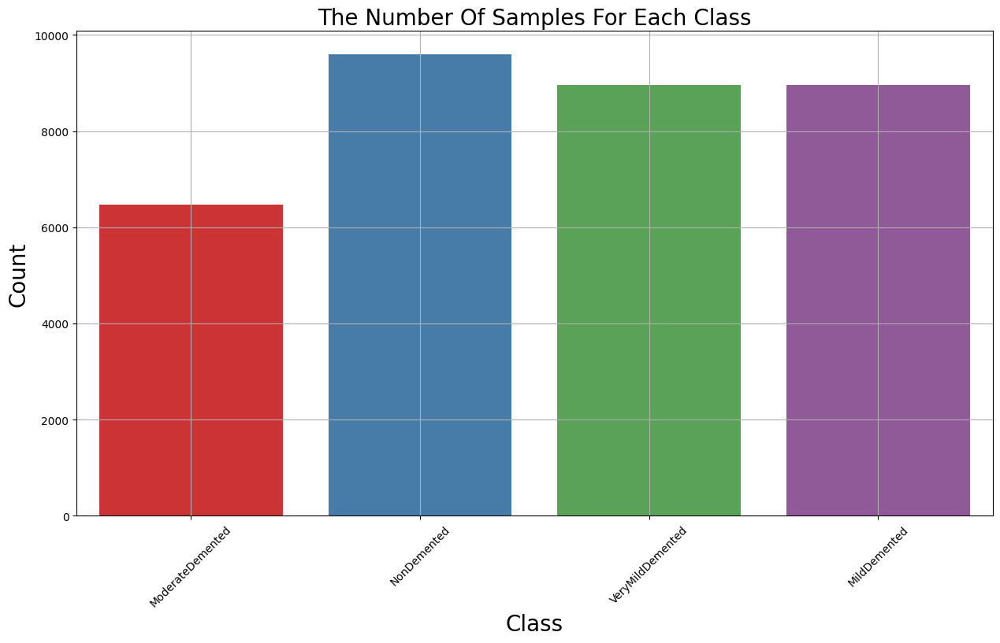

In [ ]:
# Plots the number of samples for each class
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

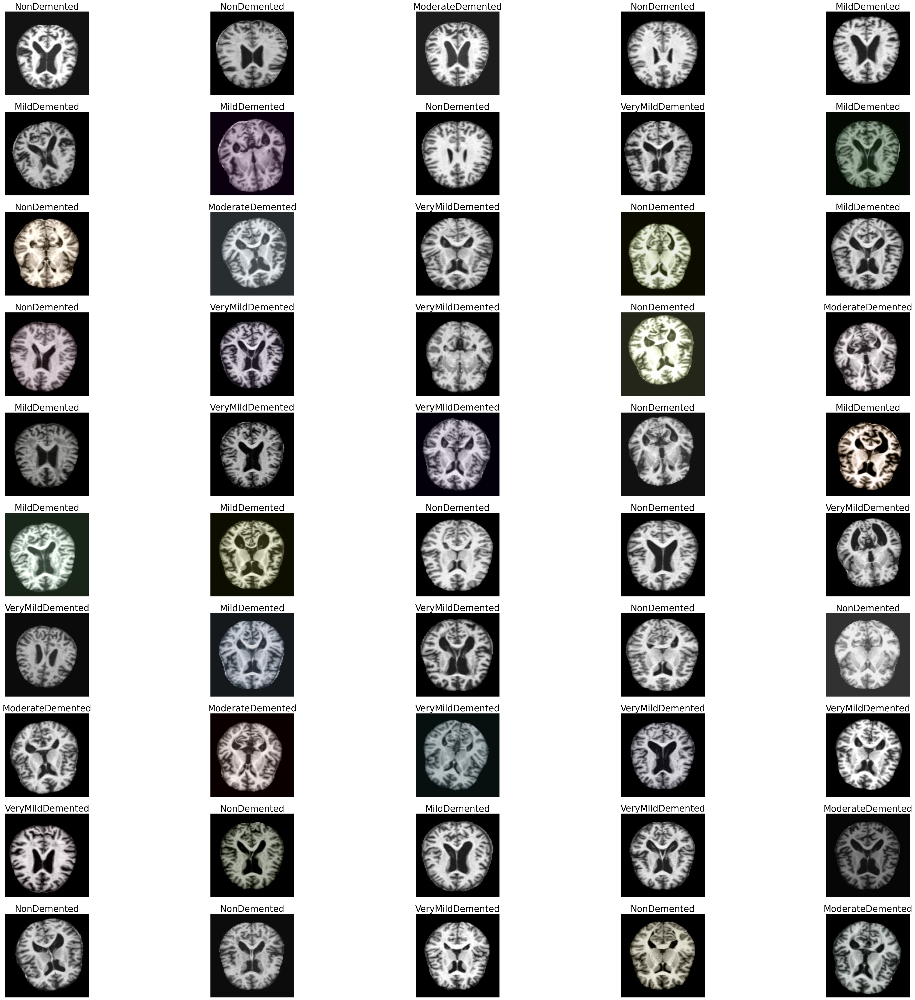

In [ ]:
# Displays a grid of 50 randomly selected sample images with their class labels
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

In [ ]:
# Defines the target image size
Size = (176,176)

# Creates an ImageDataGenerator for rescaling images
work_dr = ImageDataGenerator(
    rescale = 1./255
)

# Loads all images and labels into a single batch for further processing
train_data_gen = work_dr.flow_from_dataframe(df,x_col = 'image', y_col = 'label', target_size = Size, batch_size = 6500, shuffle = False)

Found 33984 validated image filenames belonging to 4 classes.


In [ ]:
# Extracts image data and labels from the data generator
train_data, train_labels = next(train_data_gen)

In [ ]:
# Retrieves the class names from the data generator
class_num=list(train_data_gen.class_indices.keys())
class_num

['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']

In [ ]:
# Applies SMOTE to balance the classes in the training data
sm = SMOTE(random_state=42)

train_data, train_labels = sm.fit_resample(train_data.reshape(-1, 176 * 176 * 3), train_labels)
train_data = train_data.reshape(-1, 176,176, 3)

print(train_data.shape, train_labels.shape)

(12928, 176, 176, 3) (12928, 1)


In [ ]:
# Splits the data into training, validation, and test sets
X_train, X_test1, y_train, y_test1 = train_test_split(train_data,train_labels, test_size=0.3, random_state=42,shuffle=True,stratify=train_labels)
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)

num_classes = 4  

# Converts the labels to one-hot encoding
y_train = to_categorical(y_train, num_classes=num_classes)
y_val = to_categorical(y_val, num_classes=num_classes)
y_test = to_categorical(y_test, num_classes=num_classes)

print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('X_val shape is ' , X_val.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)
print('y_val shape is ' , y_val.shape)

X_train shape is  (9049, 176, 176, 3)
X_test shape is  (1940, 176, 176, 3)
X_val shape is  (1939, 176, 176, 3)
y_train shape is  (9049, 4)
y_test shape is  (1940, 4)
y_val shape is  (1939, 4)


In [ ]:
# Defines a Convolutional Neural Network (CNN) model for multiclass classification
model = keras.models.Sequential()

model.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))
model.add(keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='same'))

model.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))

model.add(keras.layers.Conv2D(128,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))

model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(1024,activation='relu'))

model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(4,activation='softmax'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 88, 88, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 44, 44, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 22, 22, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 11, 11, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 6, 6, 128)           │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1024)                │       1,180,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │           4,100 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,278,020 (4.88 MB)

 Trainable params: 1,278,020 (4.88 MB)

 Non-trainable params: 0 (0.00 B)

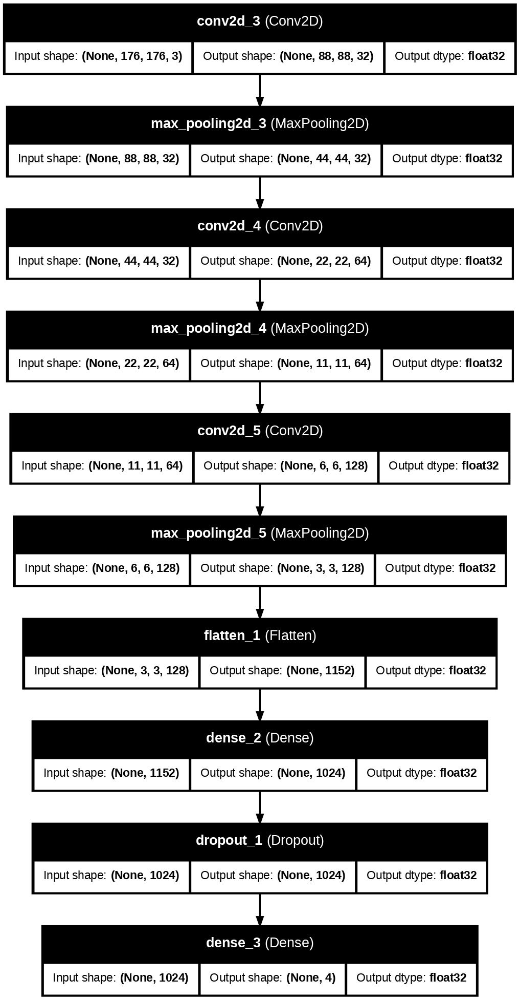

In [ ]:
# Displays the model summary and saves a visualization of the model architecture
model.summary()

tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, show_dtype=True, dpi=120)

In [ ]:
# Sets up model checkpoint and early stopping callbacks
checkpoint_cb = ModelCheckpoint("Complex_CNN_model.keras", save_best_only = True)
early_stopping_cb = EarlyStopping(patience = 10, restore_best_weights = True)

# Compiles and trains the model
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
hist = model.fit(X_train,y_train, epochs = 50, validation_data = (X_val,y_val), callbacks = [checkpoint_cb, early_stopping_cb])

Epoch 1/50
283/283 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step - accuracy: 0.8315 - loss: 0.3344 - val_accuracy: 1.0000 - val_loss: 0.0032
Epoch 2/50
283/283 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.9990 - val_loss: 0.0046
Epoch 3/50
283/283 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 1.0000 - val_loss: 4.8689e-04
Epoch 4/50
283/283 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 1.0000 - loss: 6.5222e-05 - val_accuracy: 1.0000 - val_loss: 1.9010e-04
Epoch 5/50
283/283 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 1.0000 - loss: 2.8679e-05 - val_accuracy: 1.0000 - val_loss: 2.0160e-04
Epoch 6/50
283/283 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 1.0000 - loss: 1.9549e-05 - val_accuracy: 1.0000 - val_loss: 1.9197e-04
Epoch 7/50
283/283 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 1.0000 - loss: 1.0095e-05 - val_accuracy: 1.0000 - val_loss: 1.2658e-04
Epoch 8/50
283/283 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accur

In [ ]:
# Converts the training history to a DataFrame for analysis
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.934357,1.442056e-01,1.000000,3.170517e-03
1,0.996022,1.061422e-02,0.998969,4.587140e-03
2,0.999226,2.898437e-03,1.000000,4.868908e-04
3,1.000000,5.970484e-05,1.000000,1.900974e-04
4,1.000000,2.650171e-05,1.000000,2.016025e-04
5,1.000000,1.671418e-05,1.000000,1.919709e-04
6,1.000000,1.098277e-05,1.000000,1.265796e-04
7,1.000000,6.921144e-06,1.000000,1.856704e-04
8,1.000000,1.109158e-05,1.000000,2.032655e-04
9,1.000000,4.684794e-06,1.000000,9.754738e-05


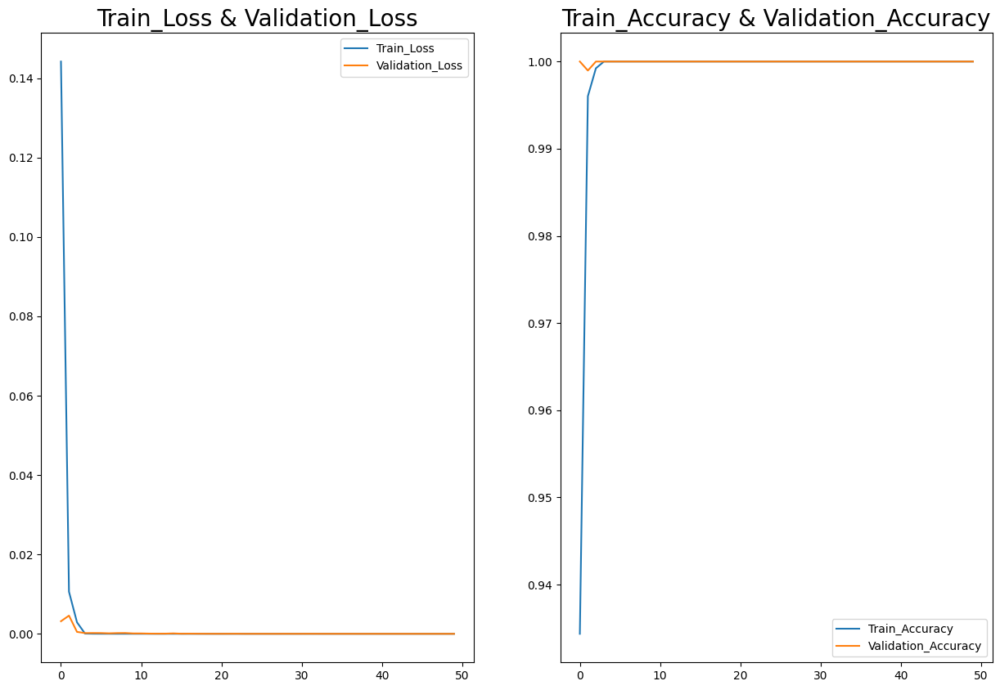

In [ ]:
# Plots the training and validation loss and accuracy curves
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

In [ ]:
# Evaluates the trained model on the test set
score, acc = model.evaluate(X_test,y_test)

print('Test Loss =', score)
print('Test Accuracy =', acc)

61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 1.0000 - loss: 2.3394e-06
Test Loss = 1.647254634917772e-06
Test Accuracy = 1.0


In [ ]:
# Makes predictions on the test set and compares actual vs predicted labels
predictions = model.predict(X_test)

y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)

df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


,Actual,Prediction
0,1,1
1,1,1
2,1,1
3,0,0
4,0,0
...,...,...
1935,0,0
1936,1,1
1937,0,0
1938,0,0


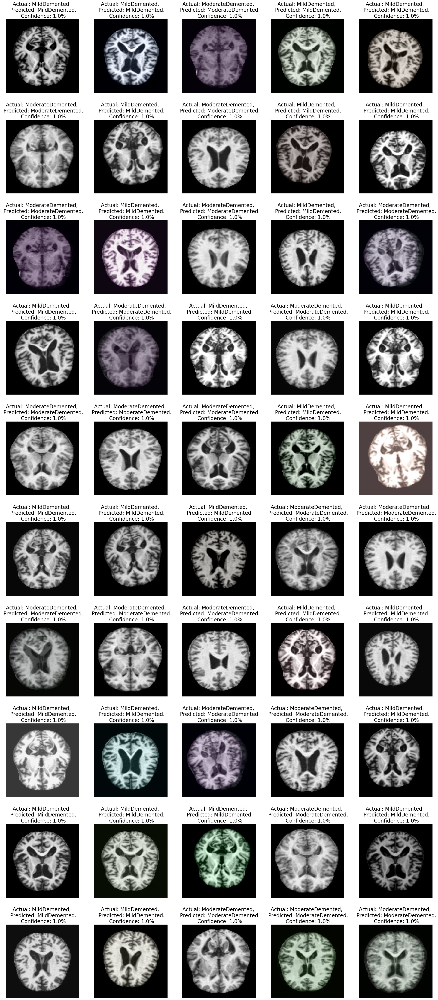

In [ ]:
# Displays a grid of 50 random test images with actual and predicted labels and confidence scores
plt.figure(figsize=(30,70))

for n,i in enumerate(np.random.randint(0,len(X_test),50)):
    plt.subplot(10,5,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"Actual: {class_num[y_test_[i]]}, \n Predicted: {class_num[y_pred[i]]}.\n Confidence: {round(predictions[i][np.argmax(predictions[i])],0)}%",fontsize=20)

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


array([[970,   0],
       [  0, 970]])

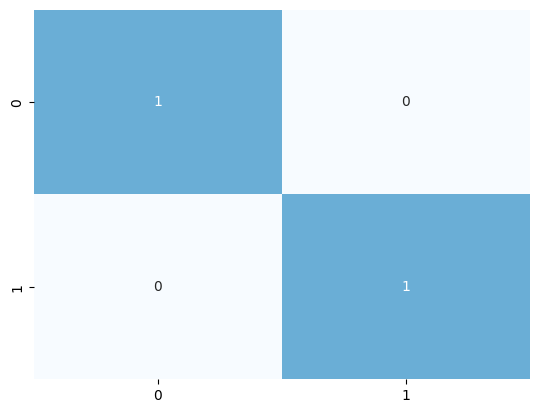

In [ ]:
# Calculates and visualizes the confusion matrix as a heatmap
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
# Prints the classification report for the test set
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       1.00      1.00      1.00       970
           1       1.00      1.00      1.00       970

    accuracy                           1.00      1940
   macro avg       1.00      1.00      1.00      1940
weighted avg       1.00      1.00      1.00      1940

